<a href="https://colab.research.google.com/github/Erna23/ToI_ComputerVision/blob/main/0924_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()

In [7]:
import os

# Kaggle API 세팅
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [8]:
!kaggle datasets download -d ashishsaxena2209/animal-image-datasetdog-cat-and-panda -p /content

Dataset URL: https://www.kaggle.com/datasets/ashishsaxena2209/animal-image-datasetdog-cat-and-panda
License(s): unknown
 99% 371M/376M [00:03<00:00, 120MB/s] 
100% 376M/376M [00:03<00:00, 129MB/s]


In [9]:
!unzip -q /content/animal-image-datasetdog-cat-and-panda.zip -d /content/data

In [10]:
for root, dirs, files in os.walk("/content/data"):
    print(root, len(files))

/content/data 0
/content/data/images 3
/content/data/animals 0
/content/data/animals/images 3
/content/data/animals/panda 1000
/content/data/animals/cats 1000
/content/data/animals/animals 0
/content/data/animals/animals/panda 1000
/content/data/animals/animals/cats 1000
/content/data/animals/animals/dogs 1000
/content/data/animals/dogs 1000


In [11]:
# 라이브러리 설치 & 기본 임포트
!pip -q install opencv-python scikit-learn matplotlib pandas tqdm

import os, glob, cv2, json, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from tqdm import tqdm

In [12]:
# 보기 좋게
plt.rcParams["figure.figsize"] = (4,4)
random.seed(42); np.random.seed(42)

In [13]:
# 1) 데이터 경로 확인 & 인덱싱 (폴더 -> 라벨)
DATA_ROOT = "/content/data/animals"
assert os.path.exists(DATA_ROOT), f"데이터 폴더가 없어요: {DATA_ROOT}"

# jpg, jpeg, png 파일 모두 수집
img_paths = []
for ext in ("*.jpg", "*.jpeg", "*.png"):
    img_paths.extend(glob.glob(os.path.join(DATA_ROOT, "**", ext), recursive=True))

print(f"총 이미지 수: {len(img_paths)}")


총 이미지 수: 6003


In [14]:
def path_to_label(p):
    # 라벨 = 상위 폴더명 (.../class_name/xxx.jpg)
    return os.path.basename(os.path.dirname(p))

df = pd.DataFrame({"path": img_paths})
df["label"] = df["path"].apply(path_to_label)

# 라벨 인코딩 (문자 -> 정수)
le = LabelEncoder()
df["label_id"] = le.fit_transform(df["label"])

print("클래스 목록:", list(le.classes_))
df.sample(5)

클래스 목록: ['cats', 'dogs', 'images', 'panda']


,path,label,label_id
1782,/content/data/animals/cats/cats_00649.jpg,cats,0
3917,/content/data/animals/animals/cats/cats_00671.jpg,cats,0
221,/content/data/animals/panda/panda_00246.jpg,panda,3
2135,/content/data/animals/animals/panda/panda_0057...,panda,3
5825,/content/data/animals/dogs/dogs_00255.jpg,dogs,1


In [15]:
# 2) 전처리 함수 (리사이즈, 블러, 정규화)
# BLUR_MODE: "none" | "gaussian" | "median" | "bilateral"
# NORMALIZE: "unit"(0~1 스케일) -> 이후 z-score(채널별 표준화)까지 옵션 제공

IMG_SIZE   = (224, 224)      # (W, H)
BLUR_MODE  = "gaussian"      # "none" / "gaussian" / "median" / "bilateral"
DO_UNIT_SCALE = True         # 0~1 스케일 정규화
DO_ZSCORE    = True          # 채널별 평균/표준편차 정규화 (아래에서 통계 추정 후 적용)

def apply_blur(img_bgr, mode="gaussian"):
    if mode == "none":
        return img_bgr
    if mode == "gaussian":
        return cv2.GaussianBlur(img_bgr, (5,5), 0)
    if mode == "median":
        return cv2.medianBlur(img_bgr, 5)
    if mode == "bilateral":
        return cv2.bilateralFilter(img_bgr, d=9, sigmaColor=75, sigmaSpace=75)
    raise ValueError("BLUR_MODE는 none/gaussian/median/bilateral 중 하나여야 합니다.")


In [16]:
def preprocess_image(path, img_size=IMG_SIZE, blur_mode=BLUR_MODE, unit_scale=DO_UNIT_SCALE):
    # 1) 로드 (BGR)
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise ValueError(f"이미지 로드 실패: {path}")
    # 2) 리사이즈
    img = cv2.resize(img, img_size, interpolation=cv2.INTER_AREA)
    # 3) 블러
    img = apply_blur(img, blur_mode)
    # 4) BGR->RGB
    img = img[..., ::-1]
    # 5) 0~1 스케일
    if unit_scale:
        img = img.astype(np.float32) / 255.0
    else:
        img = img.astype(np.float32)
    return img  # (H, W, 3), float32

In [17]:
# 3) 채널별 평균/표준편차 추정 (z-score용 통계) : 샘플 200장으로 통계 추정
SAMPLE_N = min(200, len(df))
sample_paths = df["path"].sample(SAMPLE_N, random_state=0).tolist()

stack = []
for p in tqdm(sample_paths, desc="통계용 샘플 전처리"):
    img = preprocess_image(p, blur_mode="none", unit_scale=True)  # 통계는 블러 없이 0~1 기준으로 추정
    stack.append(img)
stack = np.stack(stack, axis=0)   # (N, H, W, 3)
channel_mean = stack.mean(axis=(0,1,2))
channel_std  = stack.std(axis=(0,1,2)) + 1e-8
channel_mean, channel_std


통계용 샘플 전처리: 100%|██████████| 200/200 [00:01<00:00, 133.75it/s]


(array([0.46164647, 0.43874887, 0.3927822 ], dtype=float32),
 array([0.26900834, 0.2630568 , 0.2608772 ], dtype=float32))

In [18]:
# 표준화 함수
def zscore(img_rgb_float01, mean=channel_mean, std=channel_std):
    # img: float32, 0~1 가정
    return (img_rgb_float01 - mean) / std

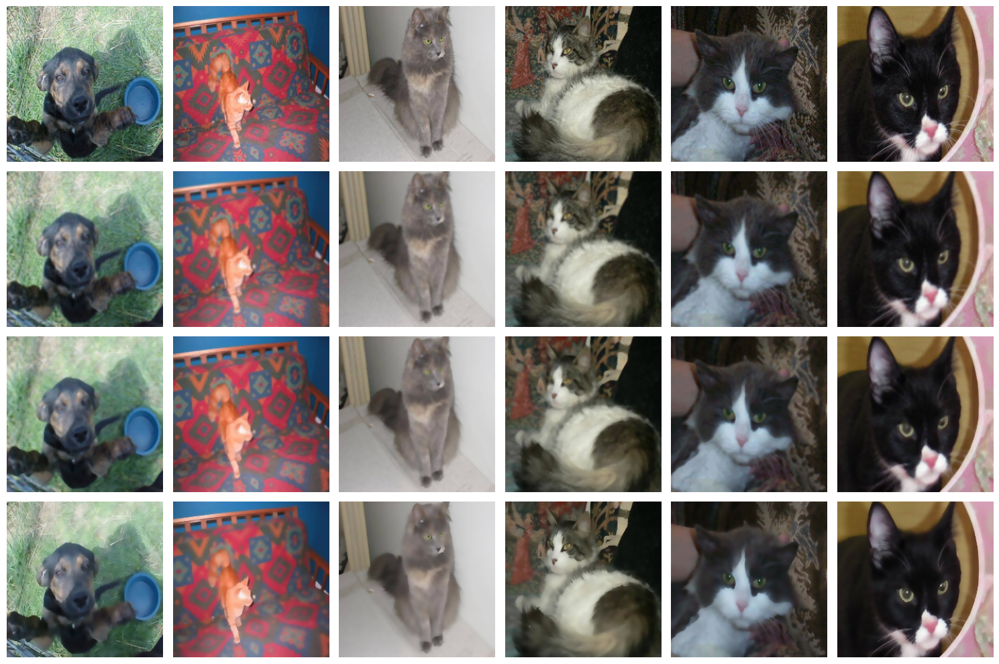

In [19]:
# 4) 블러 전/후 비교 시각화 (샘플 6장)
SAMPLES_TO_SHOW = 6
show_paths = df["path"].sample(SAMPLES_TO_SHOW, random_state=1).tolist()

modes = ["none", "gaussian", "median", "bilateral"]
fig, axes = plt.subplots(len(modes), SAMPLES_TO_SHOW, figsize=(SAMPLES_TO_SHOW*2.5, len(modes)*2.5))

for r, mode in enumerate(modes):
    for c, p in enumerate(show_paths):
        img = preprocess_image(p, blur_mode=mode, unit_scale=True)
        axes[r, c].imshow(img)
        axes[r, c].axis("off")
        if c == 0:
            axes[r, c].set_ylabel(mode, rotation=0, labelpad=30, fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
SAMPLES_TO_SHOW = 6
show_paths = df["path"].sample(SAMPLES_TO_SHOW, random_state=1).tolist()

modes = ["none", "gaussian", "median", "bilateral"]
fig, axes = plt.subplots(len(modes), SAMPLES_TO_SHOW, figsize=(SAMPLES_TO_SHOW*2.5, len(modes)*2.5))

for r, mode in enumerate(modes):
    for c, p in enumerate(show_paths):
        img = preprocess_image(p, blur_mode=mode, unit_scale=True)
        axes[r, c].imshow(img)
        axes[r, c].axis("off")
        if c == 0:
            axes[r, c].set_ylabel(mode, rotation=0, labelpad=30, fontsize=10)
plt.tight_layout()
plt.show()

In [20]:
# 5) 본 전처리 파이프라인 적용 & 저장 (미리보기 30장만)
PREVIEW_DIR = "/content/processed_preview"
os.makedirs(PREVIEW_DIR, exist_ok=True)

preview_paths = df["path"].sample(30, random_state=2).tolist()

for i, p in enumerate(preview_paths, 1):
    img = preprocess_image(p, blur_mode=BLUR_MODE, unit_scale=DO_UNIT_SCALE)
    if DO_ZSCORE and DO_UNIT_SCALE:
        img = zscore(img)  # (선택) 채널별 표준화
        # 시각화를 위해 0~1로 다시 스케일링 (z-score는 음/양 값이 가능)
        vis = (img - img.min()) / (img.max() - img.min() + 1e-8)
    else:
        vis = img
    out_path = os.path.join(PREVIEW_DIR, f"sample_{i:02d}.png")
    plt.imsave(out_path, vis)

print("미리보기 저장:", PREVIEW_DIR)

미리보기 저장: /content/processed_preview


In [21]:
# 6) 라벨 인코딩 & 원-핫 인코딩
# 이미 df['label_id']가 정수 라벨임
num_classes = len(le.classes_)
print("클래스 개수:", num_classes, " -> ", list(le.classes_))

클래스 개수: 4  ->  ['cats', 'dogs', 'images', 'panda']


In [22]:
# 원-핫 인코더
ohe = OneHotEncoder(sparse_output=False, dtype=np.float32)
y_onehot = ohe.fit_transform(df[["label_id"]])
print("원-핫 shape:", y_onehot.shape)

원-핫 shape: (6003, 4)


In [23]:
# 예시: 임의 샘플 5개 확인
df_sample = df.sample(5, random_state=123).reset_index(drop=True)
display(df_sample[["label", "label_id"]])
print(ohe.transform(df_sample[["label_id"]]))

,label,label_id
0,panda,3
1,cats,0
2,cats,0
3,panda,3
4,dogs,1


[[0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]]


In [24]:
# 7) 배치 전처리 제너레이터
def batch_generator(df, batch_size=16, shuffle=True,
                    blur_mode=BLUR_MODE, unit_scale=DO_UNIT_SCALE, do_zscore=DO_ZSCORE):
    idxs = np.arange(len(df))
    while True:
        if shuffle: np.random.shuffle(idxs)
        for start in range(0, len(df), batch_size):
            batch_idx = idxs[start:start+batch_size]
            paths = df.iloc[batch_idx]["path"].tolist()
            labels = df.iloc[batch_idx]["label_id"].to_numpy()
            imgs = []
            for p in paths:
                img = preprocess_image(p, blur_mode=blur_mode, unit_scale=unit_scale)
                if do_zscore and unit_scale:
                    img = zscore(img)
                imgs.append(img)
            X = np.stack(imgs, axis=0)   # (B, H, W, 3)
            y = labels.astype(np.int64)  # (B,)
            yield X, y

gen = batch_generator(df, batch_size=12, shuffle=True)
Xb, yb = next(gen)
Xb.shape, yb.shape, yb[:10]

((12, 224, 224, 3), (12,), array([1, 1, 0, 0, 0, 1, 3, 1, 1, 0]))

In [25]:
# A. 리사이즈 (비율 유지 + 패딩 vs 센터크롭 vs 스트레치)
import cv2, numpy as np

def resize_keep_ratio_with_pad(img, target=(224,224), pad_value=0):
    h,w = img.shape[:2]; th, tw = target[1], target[0]
    scale = min(tw/w, th/h)
    nw, nh = int(w*scale), int(h*scale)
    resized = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA)
    out = np.full((th, tw, 3), pad_value, dtype=resized.dtype)
    top = (th - nh)//2; left = (tw - nw)//2
    out[top:top+nh, left:left+nw] = resized
    return out

def resize_center_crop(img, target=(224,224)):
    h,w = img.shape[:2]; tw, th = target
    # 먼저 min쪽에 맞춰 리사이즈
    scale = max(tw/w, th/h)
    nw, nh = int(w*scale), int(h*scale)
    resized = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_CUBIC)
    # 센터 크롭
    x1 = (nw - tw)//2; y1 = (nh - th)//2
    return resized[y1:y1+th, x1:x1+tw]

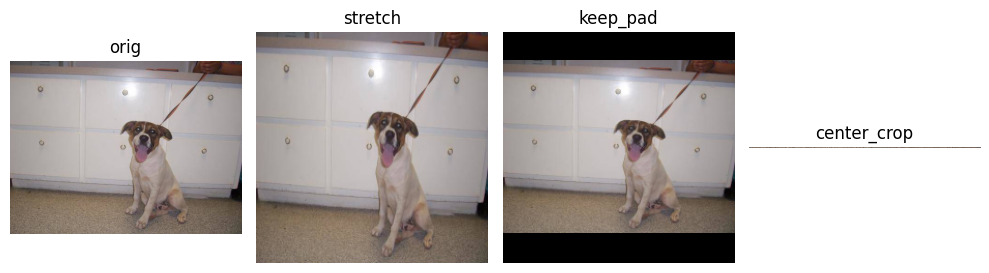

In [26]:
import matplotlib.pyplot as plt
import os, cv2, numpy as np

# df에 이미지 경로가 담겨있다고 가정
p = df["path"].sample(1, random_state=0).iloc[0]
orig_bgr = cv2.imread(p)
orig_rgb = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB)

pad_rgb   = cv2.cvtColor(resize_keep_ratio_with_pad(orig_bgr, (224,224)), cv2.COLOR_BGR2RGB)
crop_rgb  = cv2.cvtColor(resize_center_crop(orig_bgr, (224,224)), cv2.COLOR_BGR2RGB)
stretch_rgb = cv2.cvtColor(cv2.resize(orig_bgr, (224,224), interpolation=cv2.INTER_AREA), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,3))
plt.subplot(1,4,1); plt.imshow(orig_rgb);    plt.title("orig");     plt.axis('off')
plt.subplot(1,4,2); plt.imshow(stretch_rgb); plt.title("stretch");  plt.axis('off')
plt.subplot(1,4,3); plt.imshow(pad_rgb);     plt.title("keep_pad"); plt.axis('off')
plt.subplot(1,4,4); plt.imshow(crop_rgb);    plt.title("center_crop"); plt.axis('off')
plt.tight_layout(); plt.show()

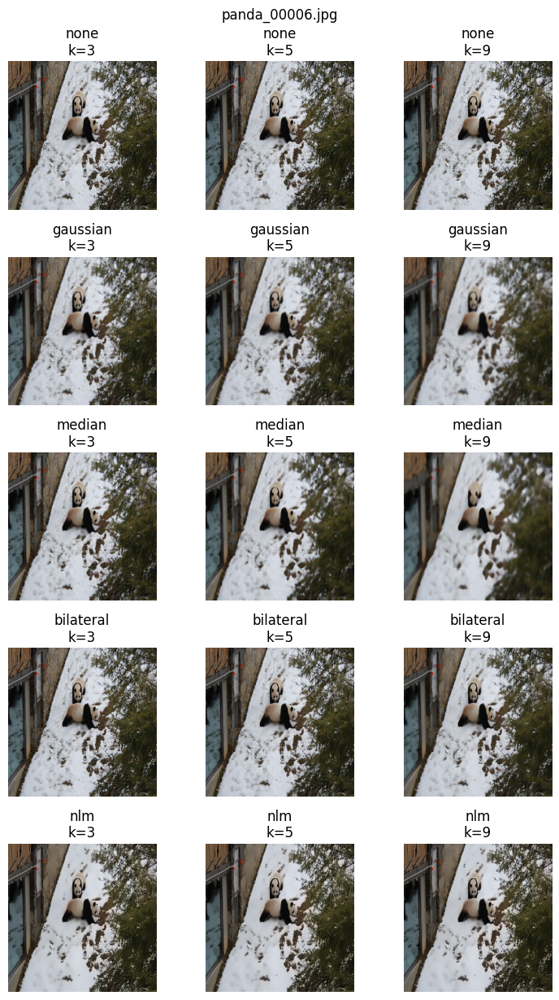

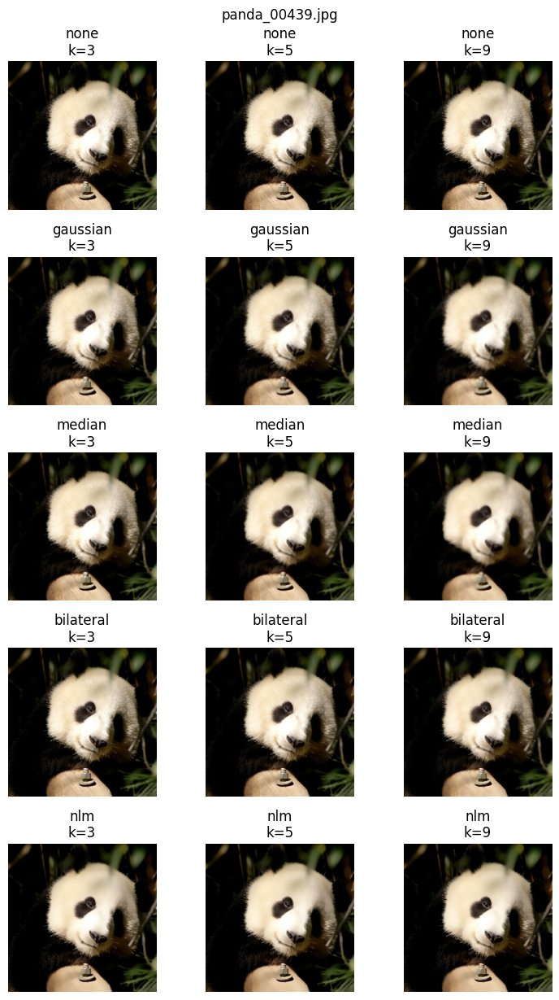

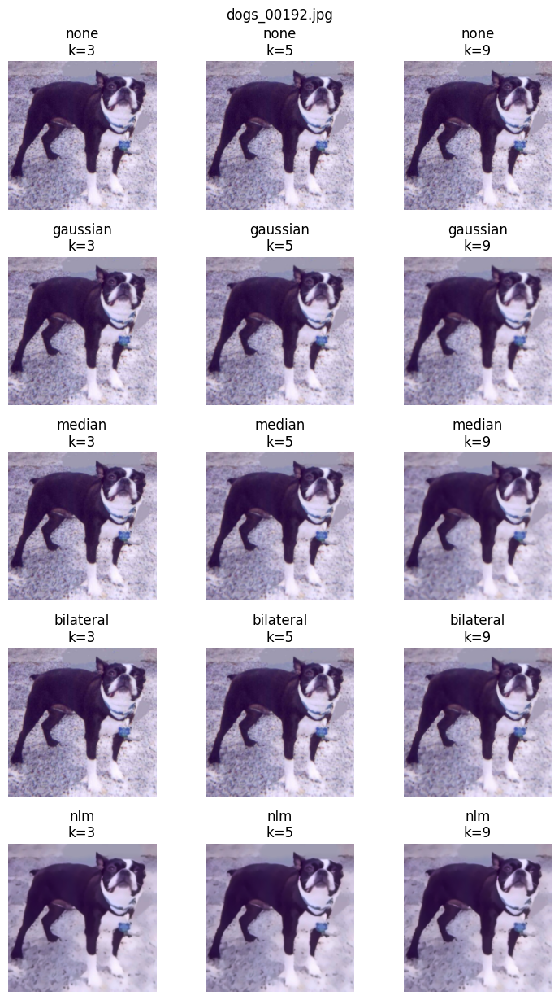

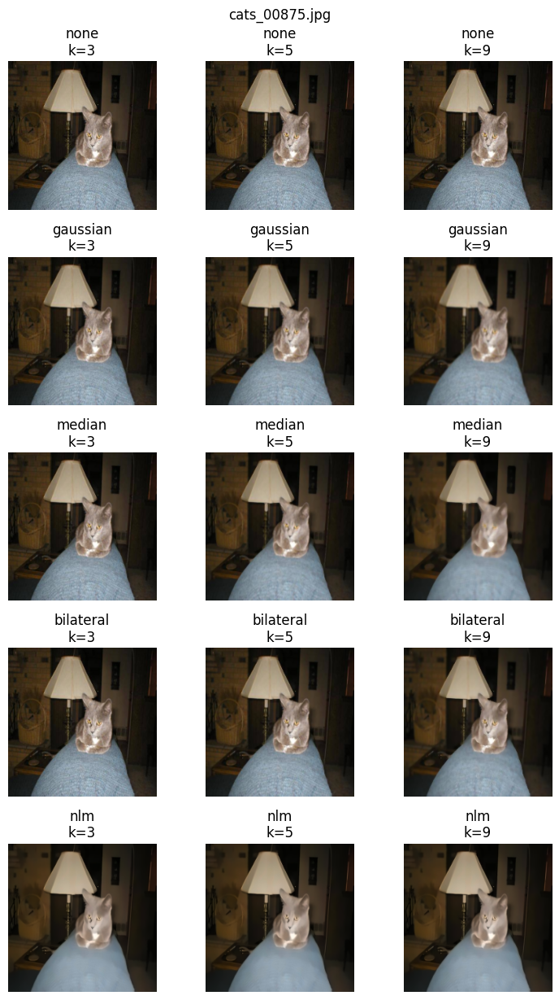

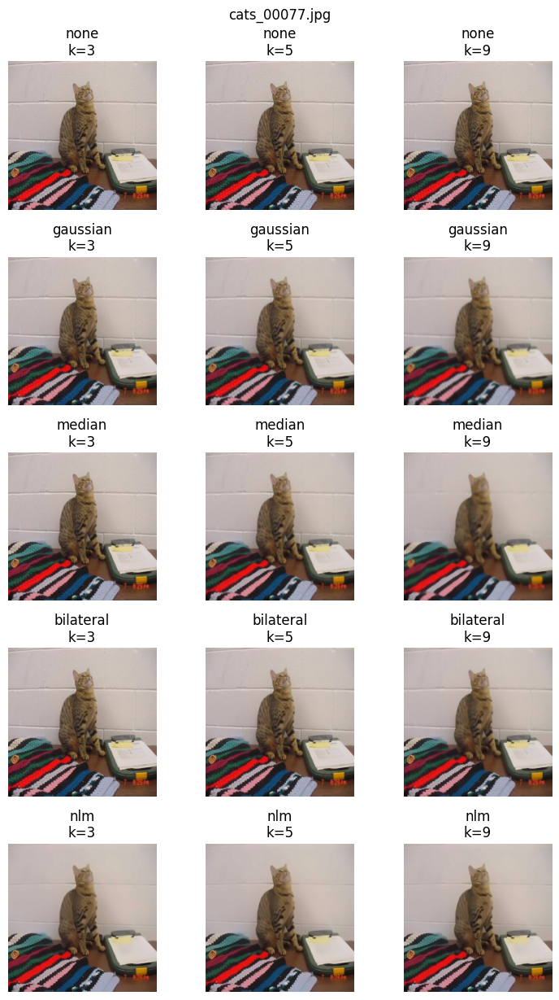

In [29]:
# B. 블러 파라미터 스윕 시각화
def apply_blur_param(img_bgr, mode="gaussian", k=5, sigma=0):
    if mode == "none":      return img_bgr
    if mode == "gaussian":  return cv2.GaussianBlur(img_bgr, (k,k), sigma)
    if mode == "median":    return cv2.medianBlur(img_bgr, k)
    if mode == "bilateral": return cv2.bilateralFilter(img_bgr, d=k, sigmaColor=75, sigmaSpace=75)
    if mode == "nlm":       return cv2.fastNlMeansDenoisingColored(img_bgr, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21)
    raise ValueError

modes = ["none","gaussian","median","bilateral","nlm"]
ks    = [3,5,9]  # 커널/강도
paths = df["path"].sample(5, random_state=7).tolist()  # 5장만 예시

for p in paths:
    src = cv2.imread(p)
    fig, axes = plt.subplots(len(modes), len(ks), figsize=(len(ks)*2.5, len(modes)*2.5))
    fig.suptitle(os.path.basename(p))
    for i,m in enumerate(modes):
        for j,k in enumerate(ks):
            out = apply_blur_param(src, m, k)
            out = cv2.resize(out, (224,224))
            axes[i,j].imshow(out[...,::-1])
            axes[i,j].set_title(f"{m}\nk={k}")
            axes[i,j].axis("off")
    plt.tight_layout(); plt.show()

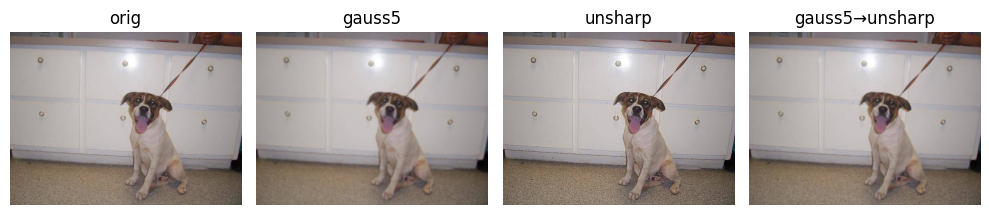

In [30]:
# C. 샤프닝(언샵 마스크) 비교
def unsharp_mask(img_bgr, ksize=5, amount=1.0, threshold=0):
    blurred = cv2.GaussianBlur(img_bgr, (ksize,ksize), 0)
    sharp = cv2.addWeighted(img_bgr, 1+amount, blurred, -amount, 0)
    if threshold <= 0: return sharp
    low_contrast_mask = np.abs(img_bgr - blurred) < threshold
    np.copyto(sharp, img_bgr, where=low_contrast_mask)
    return sharp

p = df["path"].sample(1, random_state=0).iloc[0]
img = cv2.imread(p)
g5  = cv2.GaussianBlur(img, (5,5), 0)
u1  = unsharp_mask(img, ksize=5, amount=1.0)
g5u = unsharp_mask(g5,  ksize=5, amount=1.0)

plt.figure(figsize=(10,3))
for i,(im,title) in enumerate([(img,"orig"),(g5,"gauss5"),(u1,"unsharp"),(g5u,"gauss5→unsharp")],1):
    plt.subplot(1,4,i); plt.imshow(im[...,::-1]); plt.title(title); plt.axis('off')
plt.tight_layout(); plt.show()

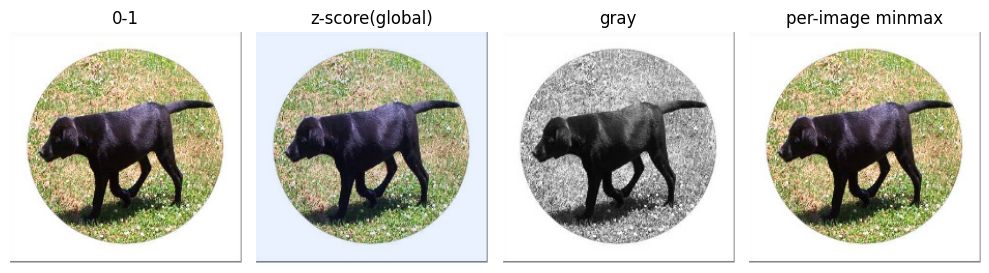

In [31]:
# D. 정규화 방식 비교
def to_gray_rgb(img_rgb):
    g = cv2.cvtColor((img_rgb*255).astype(np.uint8)[...,::-1], cv2.COLOR_BGR2GRAY)
    return cv2.cvtColor(g, cv2.COLOR_GRAY2RGB)

def minmax_per_image(img):
    mn, mx = img.min(), img.max()
    return (img - mn) / (mx - mn + 1e-8)

p = df["path"].sample(1, random_state=22).iloc[0]
bgr = cv2.imread(p)
rgb = cv2.resize(bgr[...,::-1], (224,224)).astype(np.float32)/255.0

z  = (rgb - channel_mean)/channel_std
z_vis = minmax_per_image(z)
gray  = to_gray_rgb(rgb)
perimg = minmax_per_image(rgb)

imgs = [rgb, z_vis, gray, perimg]
titles = ["0-1","z-score(global)","gray","per-image minmax"]

plt.figure(figsize=(10,3))
for i,(im,t) in enumerate(zip(imgs,titles),1):
    plt.subplot(1,4,i); plt.imshow(im); plt.title(t); plt.axis('off')
plt.tight_layout(); plt.show()

/usr/local/lib/python3.12/dist-packages/skimage/metrics/simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


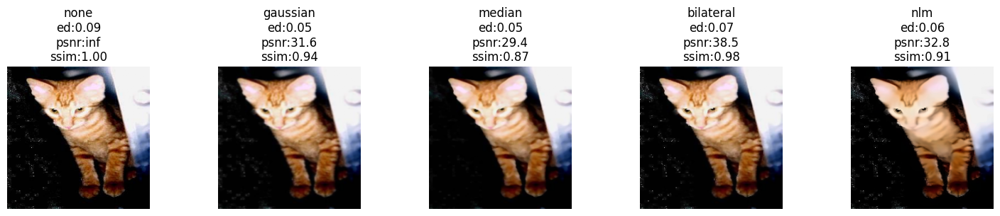

In [32]:
# E. 간단 지표 (엣지 밀도, PSNR, SSIM) 시각화
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

def edge_density(img_rgb):
    g = cv2.cvtColor((img_rgb*255).astype(np.uint8)[...,::-1], cv2.COLOR_BGR2GRAY)
    e = cv2.Canny(g, 100, 200)
    return e.mean()/255.0

modes = ["none","gaussian","median","bilateral","nlm"]
p = df["path"].sample(1, random_state=33).iloc[0]
orig = cv2.resize(cv2.imread(p)[...,::-1], (224,224)).astype(np.float32)/255.0

fig, axes = plt.subplots(1, len(modes), figsize=(15,3))
for i,m in enumerate(modes):
    proc_bgr = apply_blur_param(cv2.imread(p), m, 5)
    proc = cv2.resize(proc_bgr[...,::-1], (224,224)).astype(np.float32)/255.0
    ed = edge_density(proc)
    _psnr = psnr((orig*255).astype(np.uint8), (proc*255).astype(np.uint8), data_range=255)
    _ssim = ssim(orig, proc, channel_axis=2, data_range=1.0)
    axes[i].imshow(proc)
    axes[i].set_title(f"{m}\ned:{ed:.2f}\npsnr:{_psnr:.1f}\nssim:{_ssim:.2f}")
    axes[i].axis("off")
plt.tight_layout(); plt.show()

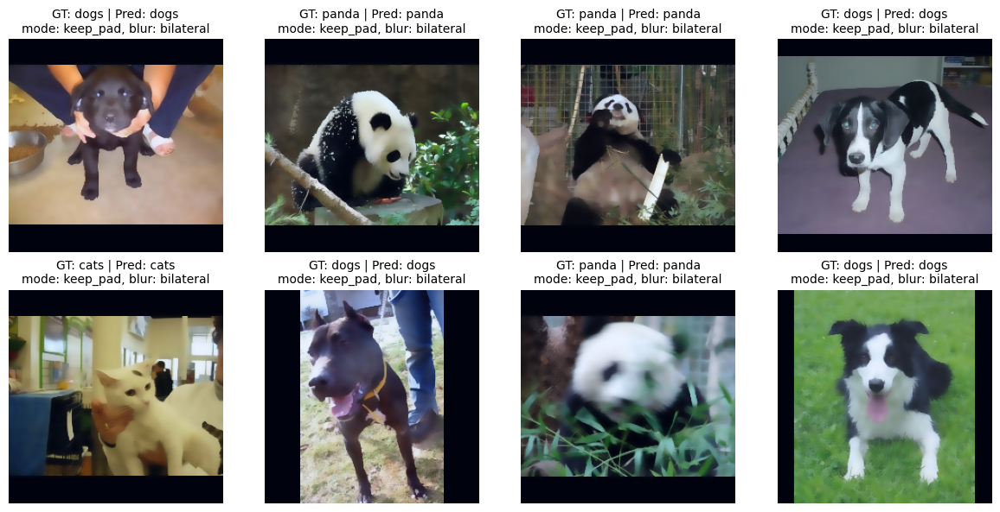

In [35]:
# F. 배치 전처리 제너레이터 미리보기
def preprocess_image_adv(path, img_size=(224,224),
                         resize_mode="stretch",
                         blur_mode="none", blur_k=5,
                         unit_scale=True, do_z=False):
    bgr = cv2.imread(path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image: {path}")

    if resize_mode == "stretch":
        bgr = cv2.resize(bgr, img_size, interpolation=cv2.INTER_AREA)
    elif resize_mode == "keep_pad":
        bgr = resize_keep_ratio_with_pad(bgr, img_size, pad_value=0)
    elif resize_mode == "center_crop":
        bgr = resize_center_crop(bgr, img_size)
    else:
        raise ValueError(f"Unknown resize_mode: {resize_mode}")

    bgr = apply_blur_param(bgr, mode=blur_mode, k=blur_k)
    rgb = bgr[..., ::-1].astype(np.float32)
    if unit_scale:
        rgb /= 255.0
    if do_z and unit_scale:
        rgb = (rgb - channel_mean) / channel_std
    return rgb

def batch_generator_adv(df, batch_size=8, shuffle=True, **pp_kwargs):
    idxs = np.arange(len(df))
    if shuffle:
        np.random.shuffle(idxs)
    sub = df.iloc[idxs[:batch_size]].reset_index(drop=True)
    imgs = [preprocess_image_adv(p, **pp_kwargs) for p in sub["path"]]
    X = np.stack(imgs, 0)
    # LabelEncoder가 df['label']에서 label_id를 보장하도록 처리
    if "label_id" not in sub.columns:
        # 호출부에서 le.transform 했다고 가정하지 않은 경우를 대비
        global le
        if "le" not in globals():
            le = LabelEncoder()
            le.fit(df["label"].tolist())
        y = le.transform(sub["label"].tolist()).astype(np.int64)
    else:
        y = sub["label_id"].to_numpy().astype(np.int64)
    return X, y, sub["path"].tolist()

try:
    le
except NameError:
    le = LabelEncoder()
    le.fit(df["label"].tolist())

# 전처리 설정(배치 전체 동일)
pp_kwargs = dict(
    img_size=(224,224),
    resize_mode="keep_pad",   # "stretch" | "keep_pad" | "center_crop"
    blur_mode="bilateral",    # "none"|"gaussian"|"median"|"bilateral"|"box"
    blur_k=9,
    unit_scale=True,
    do_z=True
)

# 배치 로드
Xb, yb, paths = batch_generator_adv(df, batch_size=8, shuffle=True, **pp_kwargs)

# 예측 (model이 없으면 정답을 그대로 예측으로 사용)
def _predict_with_fallback(model, X, num_classes):
    try:
        proba = model.predict(X, verbose=0)
        if proba.ndim == 1:  # 이진 로짓 등
            proba = np.stack([1 - proba, proba], 1)
        yhat = np.argmax(proba, axis=1)
    except Exception:
        # 모델이 없거나 실패 시: 정답을 예측으로 사용(시각화 목적)
        yhat = yb.copy()
    return yhat

num_classes = len(le.classes_)
yhat = _predict_with_fallback(globals().get("model", None), Xb, num_classes)

# 시각화 (GT/Pred + mode/blur 표시)
id2name = lambda lid: le.classes_[lid]
fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for i, (im, gt_id, pth) in enumerate(zip(Xb, yb, paths)):
    r, c = divmod(i, 4)
    # 시각화용 0~1 스케일링 (z-score 이후라도 안전하게 보기 위해)
    vis = (im - im.min()) / (im.max() - im.min() + 1e-8)
    axes[r, c].imshow(vis)
    gt_name   = id2name(gt_id)
    pred_name = id2name(yhat[i])
    mode = pp_kwargs.get("resize_mode", "?")
    blur = pp_kwargs.get("blur_mode", "none")
    axes[r, c].set_title(f"GT: {gt_name} | Pred: {pred_name}\nmode: {mode}, blur: {blur}", fontsize=10)
    axes[r, c].axis("off")
plt.tight_layout()
plt.show()

In [49]:
# 이미지 전처리 유틸 함수 모음
# - safe_imread: 안전하게 이미지 읽기 (항상 3채널 BGR)
# - resize_keep_ratio_with_pad: 비율 유지 + 패딩 리사이즈
# - resize_center_crop: 비율 유지 + 센터 크롭
# - apply_blur_param: 블러링 옵션 적용
# - channel_mean/std: ImageNet 통계 (정규화용)
import cv2, numpy as np

def safe_imread(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)   # 항상 3채널 BGR
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {path}")
    return img

def resize_keep_ratio_with_pad(img, target=(224,224), pad_value=0):
    # target: (W,H)
    W, H = target
    h, w = img.shape[:2]
    scale = min(W / w, H / h)
    nw, nh = int(w * scale), int(h * scale)
    resized = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA)
    out = np.full((H, W, 3), pad_value, dtype=resized.dtype)
    top  = (H - nh) // 2
    left = (W - nw) // 2
    out[top:top+nh, left:left+nw] = resized
    return out  # (H,W,3)

def resize_center_crop(img, target=(224,224)):
    # target: (W,H)
    W, H = target
    h, w = img.shape[:2]
    scale = max(W / w, H / h)
    nw, nh = int(w * scale), int(h * scale)
    resized = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_CUBIC)
    x1 = (nw - W) // 2
    y1 = (nh - H) // 2
    crop = resized[y1:y1+H, x1:x1+W]
    # 혹시 슬라이싱 경계 이슈 대비
    if crop.shape[:2] != (H, W):
        crop = cv2.resize(crop, (W, H), interpolation=cv2.INTER_AREA)
    return crop  # (H,W,3)

def apply_blur_param(img, mode="none", k=5):
    k = max(1, int(k) | 1)  # 홀수 보장
    if mode == "none":
        return img
    if mode == "gaussian":
        return cv2.GaussianBlur(img, (k, k), 0)
    if mode == "median":
        return cv2.medianBlur(img, k)
    if mode == "bilateral":
        return cv2.bilateralFilter(img, d=k, sigmaColor=k*6, sigmaSpace=k*6)
    if mode == "box":
        return cv2.blur(img, (k, k))
    return img

# ImageNet 통계 (0~1 RGB)
channel_mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
channel_std  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

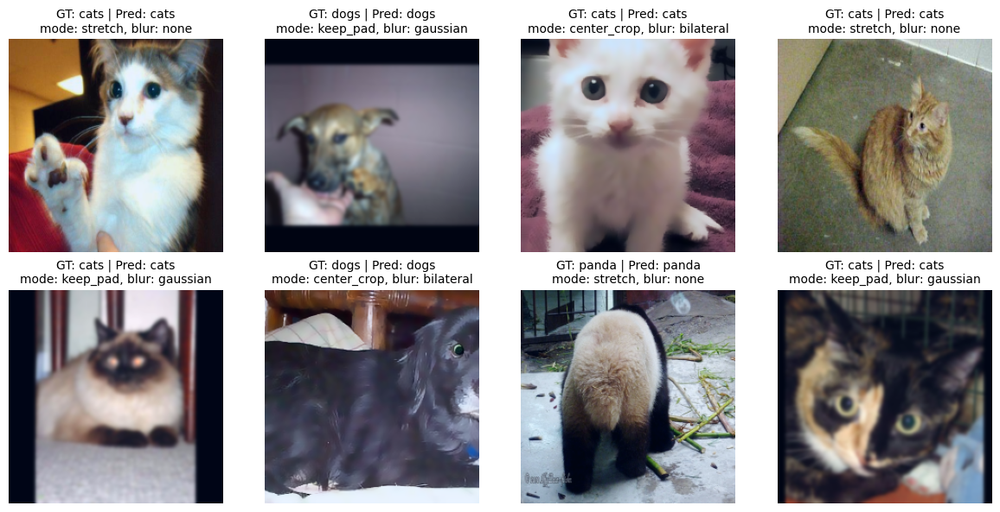

In [51]:
# 이미지 전처리(리사이즈·블러) → 배치 생성 → 레이블 인코딩 및 시각화 예제
import cv2, numpy as np, matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import itertools

# 필요: resize_keep_ratio_with_pad, resize_center_crop, apply_blur_param,
#       channel_mean, channel_std, le(LabelEncoder) 혹은 df['label']로 학습

def preprocess_image_adv(path, img_size=(224,224),
                         resize_mode="stretch",
                         blur_mode="none", blur_k=5,
                         unit_scale=True, do_z=False):
    bgr = cv2.imread(path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(path)

    if resize_mode == "stretch":
        bgr = cv2.resize(bgr, img_size, interpolation=cv2.INTER_AREA)
    elif resize_mode == "keep_pad":
        bgr = resize_keep_ratio_with_pad(bgr, img_size, pad_value=0)
    elif resize_mode == "center_crop":
        bgr = resize_center_crop(bgr, img_size)
    else:
        raise ValueError(f"Unknown resize_mode: {resize_mode}")

    bgr = apply_blur_param(bgr, mode=blur_mode, k=blur_k)
    rgb = bgr[..., ::-1].astype(np.float32)
    if unit_scale: rgb /= 255.0
    if do_z and unit_scale: rgb = (rgb - channel_mean)/channel_std

    meta = dict(path=path, resize_mode=resize_mode, blur_mode=blur_mode,
                blur_k=blur_k, unit_scale=unit_scale, do_z=do_z)
    return rgb, meta

def batch_generator_adv(df, batch_size=8, shuffle=True, **pp_kwargs):
    idxs = np.arange(len(df))
    if shuffle: np.random.shuffle(idxs)
    sub = df.iloc[idxs[:batch_size]].reset_index(drop=True)


    rm_list = pp_kwargs.get("resize_modes_each", None)  # 예: ["stretch","keep_pad","center_crop"]
    bm_list = pp_kwargs.get("blur_modes_each",   None)  # 예: ["none","gaussian","bilateral"]
    rm_cycle = itertools.cycle(rm_list) if rm_list else None
    bm_cycle = itertools.cycle(bm_list) if bm_list else None

    imgs, metas = [], []
    for p in sub["path"]:
        resize_mode = next(rm_cycle) if rm_cycle else pp_kwargs.get("resize_mode","keep_pad")
        blur_mode   = next(bm_cycle) if bm_cycle else pp_kwargs.get("blur_mode","bilateral")

        img_i, meta_i = preprocess_image_adv(
            p,
            img_size=pp_kwargs.get("img_size",(224,224)),
            resize_mode=resize_mode,
            blur_mode=blur_mode,
            blur_k=pp_kwargs.get("blur_k",9),
            unit_scale=pp_kwargs.get("unit_scale",True),
            do_z=pp_kwargs.get("do_z",True),
        )
        imgs.append(img_i); metas.append(meta_i)

    X = np.stack(imgs, 0)

    # label_id 폴백 처리
    if "label_id" in sub.columns:
        y = sub["label_id"].to_numpy().astype(np.int64)
    else:
        global le
        if "le" not in globals():
            le = LabelEncoder().fit(df["label"].tolist())
        y = le.transform(sub["label"].tolist()).astype(np.int64)

    return X, y, sub["path"].tolist(), metas

pp = dict(
    img_size=(224,224),
    unit_scale=True, do_z=True, blur_k=9,
    # 배치 전체 동일하게 쓰려면 아래 두 줄만 사용:
    # resize_mode="keep_pad", blur_mode="bilateral",
    # 이미지마다 다르게 쓰려면 아래 리스트를 사용:
    resize_modes_each=["stretch","keep_pad","center_crop"],
    blur_modes_each=["none","gaussian","bilateral"]
)

X, y, paths, metas = batch_generator_adv(df, batch_size=8, **pp)

# 예측 (모델 없으면 y를 그대로 씀)
try:
    proba = model.predict(X, verbose=0)
    if proba.ndim == 1: proba = np.stack([1-proba, proba], 1)
    yhat  = np.argmax(proba, axis=1)
except Exception:
    yhat = y.copy()

# 레이블 이름 변환자
if "le" not in globals():
    le = LabelEncoder().fit(df["label"].tolist())
id2name = lambda i: le.classes_[i]

# 시각화
fig, axes = plt.subplots(2,4, figsize=(12,6))
for i,(im,gt,meta) in enumerate(zip(X, y, metas)):
    r,c = divmod(i,4)
    vis = (im - im.min())/(im.max()-im.min()+1e-8)
    axes[r,c].imshow(vis)
    axes[r,c].set_title(
        f"GT: {id2name(gt)} | Pred: {id2name(yhat[i])}\n"
        f"mode: {meta['resize_mode']}, blur: {meta['blur_mode']}",
        fontsize=10
    )
    axes[r,c].axis("off")
plt.tight_layout(); plt.show()
